In [1]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
# Access YOLOv8 root folder
import os
os.chdir("gdrive/MyDrive/yolov8")

In [3]:
# Install YOLOv8
%pip install ultralytics

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.2/107.7 GB disk)


## Dataset

In [ ]:
# Check Dataset
!ls data/

data.yaml  Guns_data  V_data.zip


In [ ]:
# Unzip Dataset
!unzip data/V_data.zip -d ./data

Archive:  data/V_data.zip
   creating: ./data/V_data/images/
   creating: ./data/V_data/images/test/
  inflating: ./data/V_data/images/test/1008.jpg  
  inflating: ./data/V_data/images/test/1013.jpg  
  inflating: ./data/V_data/images/test/1014.jpg  
  inflating: ./data/V_data/images/test/1015.jpg  
  inflating: ./data/V_data/images/test/1017.jpg  
  inflating: ./data/V_data/images/test/1033.jpg  
  inflating: ./data/V_data/images/test/1034.jpg  
  inflating: ./data/V_data/images/test/1043.jpg  
  inflating: ./data/V_data/images/test/1046.jpg  
  inflating: ./data/V_data/images/test/1049.jpg  
  inflating: ./data/V_data/images/test/105.jpg  
  inflating: ./data/V_data/images/test/1057.jpg  
  inflating: ./data/V_data/images/test/1058.jpg  
  inflating: ./data/V_data/images/test/1070.jpg  
  inflating: ./data/V_data/images/test/1094.jpg  
  inflating: ./data/V_data/images/test/1096.jpg  
  inflating: ./data/V_data/images/test/1101.jpg  
  inflating: ./data/V_data/images/test/1116.jpg  


In [ ]:
# Check data folder
%cd data

!ls

/content/gdrive/MyDrive/yolov8/data
data.yaml  Guns_data  V_data  V_data.zip


## Data File

In [ ]:
# Download sample data file
!gdown https://drive.google.com/uc?id=1joW_me3Gtzxm4d48edbMsOpooV8snDdn

In [ ]:
# Rename sample data file
import os
os.rename("data.yaml", "face_mask.yaml")

!ls

In [ ]:
# Get Absolute Path
import os

print(os.getcwd())

/content/gdrive/MyDrive/yolov8/data


In [ ]:
# Back to root folder
%cd ../

/content/gdrive/MyDrive/yolov8


## Training Process

In [ ]:
# Train
!yolo detect train model=yolov8l.pt data=/content/gdrive/MyDrive/yolov8/data/data.yaml imgsz=640 workers=8 batch=8 device=0 epochs=300 patience=50 name=SIH_model

100% 83.7M/83.7M [00:01<00:00, 76.5MB/s]
Ultralytics YOLOv8.0.176 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8l.pt, data=/content/gdrive/MyDrive/yolov8/data/data.yaml, epochs=300, patience=50, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=SIH_model, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_m

In [ ]:
# See the accuracy
%load_ext tensorboard

%tensorboard --logdir runs/detect/yolov8_face_mask

## Continue Training

In [ ]:
# Continue Train
!yolo detect train model=/content/gdrive/MyDrive/yolov8/runs/detect/SIH_model/weights/last.pt data=/content/gdrive/MyDrive/yolov8/data/data.yaml resume=True

Ultralytics YOLOv8.0.180 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/gdrive/MyDrive/yolov8/runs/detect/SIH_model/weights/last.pt, data=/content/gdrive/MyDrive/yolov8/data/data.yaml, epochs=300, patience=50, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=SIH_model, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

In [4]:
# See the accuracy
%load_ext tensorboard

%tensorboard --logdir /content/gdrive/MyDrive/yolov8/runs/detect/SIH_model

Output hidden; open in https://colab.research.google.com to view.

## Detection

In [ ]:
# Go to inference folder and create a new folder
%cd inference

!mkdir HSV

/content/gdrive/MyDrive/yolov8/inference


In [ ]:
# Back to root folder
%cd ../../

/content/gdrive/MyDrive


In [ ]:
# Detection
!yolo detect predict model=/content/gdrive/MyDrive/yolov8/Weights/yolov8n-pose.pt source="runs/detect/predict4" save=True

WARNING ⚠️ conflicting 'task=detect' passed with 'task=pose' model. Ignoring 'task=detect' and updating to 'task=pose' to match model.
Ultralytics YOLOv8.0.180 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-pose summary (fused): 187 layers, 3289964 parameters, 0 gradients

image 1/1 /content/gdrive/MyDrive/yolov8/runs/detect/predict4/eab60ad5-3370-4cee-ac4c-fa798e5a1809.jpg: 384x640 1 person, 141.1ms
Speed: 3.1ms preprocess, 141.1ms inference, 128.7ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/pose/predict5
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [ ]:
# Function to show Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def showImage(path):
  img = mpimg.imread(path)
  plt.figure(figsize=(20,20))
  plt.axis("off")
  plt.imshow(img)
  plt.show()

def showImagesOnFolder(path):
  for file in os.listdir(path):
    if (file.endswith(".png") or file.endswith(".jpg")):
      image_path = os.path.join(path, file)
      showImage(image_path)

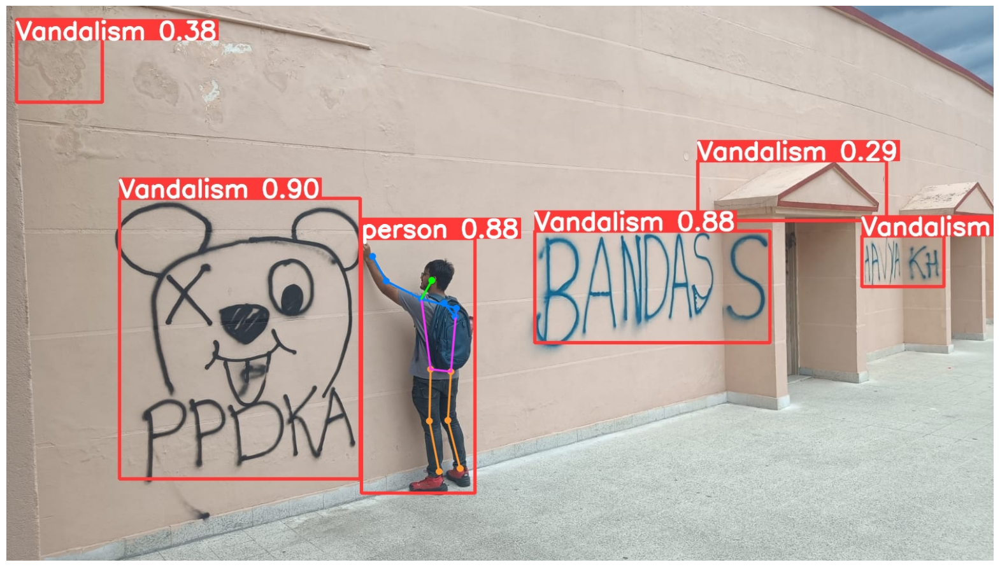

In [ ]:
# Show All Detection Result
showImagesOnFolder("runs/pose/predict5")